In [ ]:
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
from numpy import asarray
import os
from tqdm import tqdm

In [ ]:
dir_path = '/content/drive/MyDrive/Programs/Datasets/TB_Chest_Radiography_Database/'

In [ ]:
def numpize(subset: str, img_size=(128, 128), grayscale=False):
    image_dir = f'{dir_path}/{subset}/'
    image_files = os.listdir(image_dir)
    image_count = len(image_files)
    transformed_images = []

    for i in tqdm(range(1, image_count + 1), desc='Transforming...'):
        image_path = f'{image_dir}/{subset}-{i}.png'
        image = Image.open(image_path)

        # Ensure all images are in the same format
        if grayscale:
            image = image.convert('L')
        else:
            image = image.convert('RGB')

        # Resize all images
        resized_image = image.resize(img_size)
        data = np.asarray(resized_image)
        transformed_images.append(data)

    numpy_array = np.array(transformed_images)
    return numpy_array

In [ ]:
norm = numpize(subset='Normal',
               img_size=(128, 128),
               grayscale=False)
norm.shape


Transforming...: 100%|██████████| 3500/3500 [01:48<00:00, 32.40it/s]


(3500, 128, 128, 3)

In [ ]:
tb = numpize(subset='Tuberculosis',
             img_size=(128, 128),
             grayscale=False)
tb.shape

Transforming...: 100%|██████████| 700/700 [00:15<00:00, 44.54it/s]


(700, 128, 128, 3)

In [ ]:
target_norm = np.zeros(norm.shape[0])
print(f'Shape: {target_norm.shape[0]}, array: {target_norm}')

Shape: 3500, array: [0. 0. 0. ... 0. 0. 0.]


In [ ]:
target_tb = np.ones(tb.shape[0])
print(f'Shape: {target_tb.shape[0]}, array: {target_tb}')

Shape: 700, array: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

In [ ]:
def show_image(images, target, title, num_display=16, num_cols=4, cmap='gray', random_mode=False):
    # Determine the number of rows based on the num_cols parameter
    n_cols = min(num_cols, num_display)
    n_rows = int(np.ceil(num_display / n_cols))

    n_images = min(num_display, len(images))
    if random_mode:
        random_indices = np.random.choice(
            len(images), num_display, replace=False)
    else:
        random_indices = np.arange(num_display)

    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols, figsize=(20, 4*n_rows))
    for i, ax in enumerate(axes.flatten()):
        if i >= n_images:  # Check if the index exceeds the available number of images
            break
        # Incase (Did PCA)
        index = random_indices[i]
        if len(images.shape) == 2:
            image = images[index].reshape((128, 128)).astype(int)
        else:
            image = images[index]

        ax.imshow(image, cmap=cmap)
        ax.set_title("Target: {}".format(target[index]))

        # Add image index as text
        ax.text(0.5, -0.15, f'Image Index: {index}', transform=ax.transAxes,
                fontsize=10, ha='center')

    plt.suptitle(f"{title} (Displaying {num_display} Images)",
                 fontsize=16, fontweight='bold')

    fig.set_facecolor('white')
    plt.tight_layout()
    return plt.show()

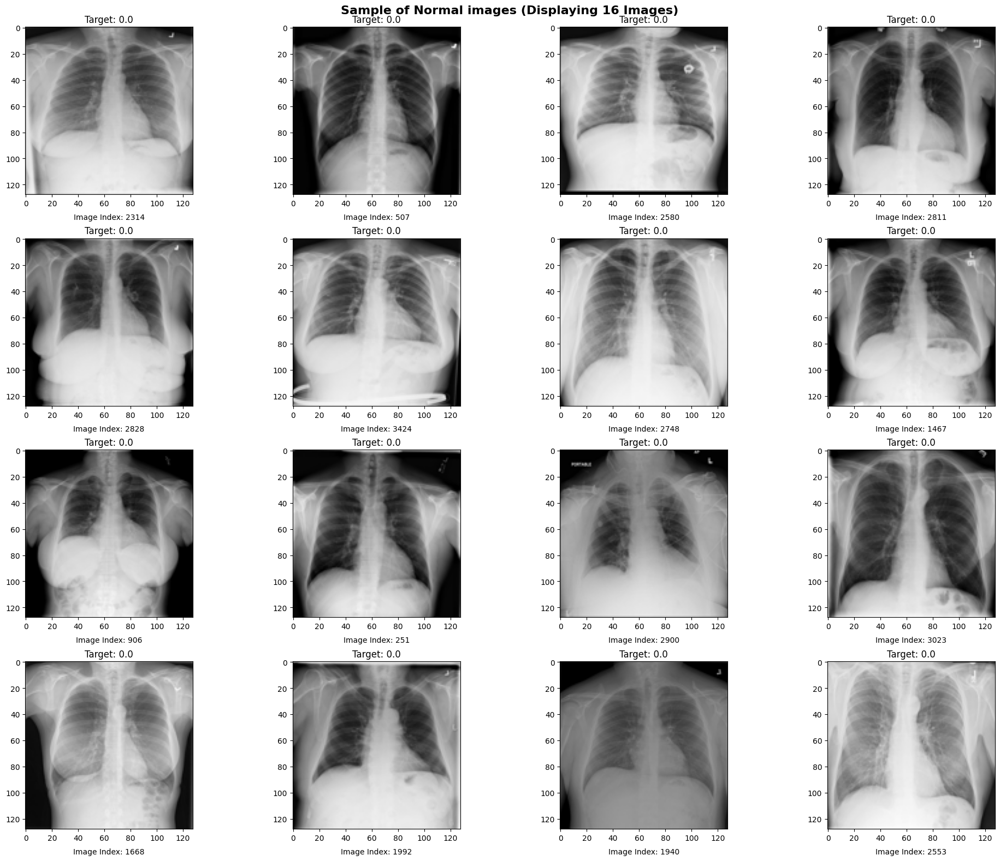

In [ ]:
show_image(images=norm,
           target=target_norm,
           title='Sample of Normal images',
           num_display=16,
           num_cols=4,
           cmap='gray',
           random_mode=True)

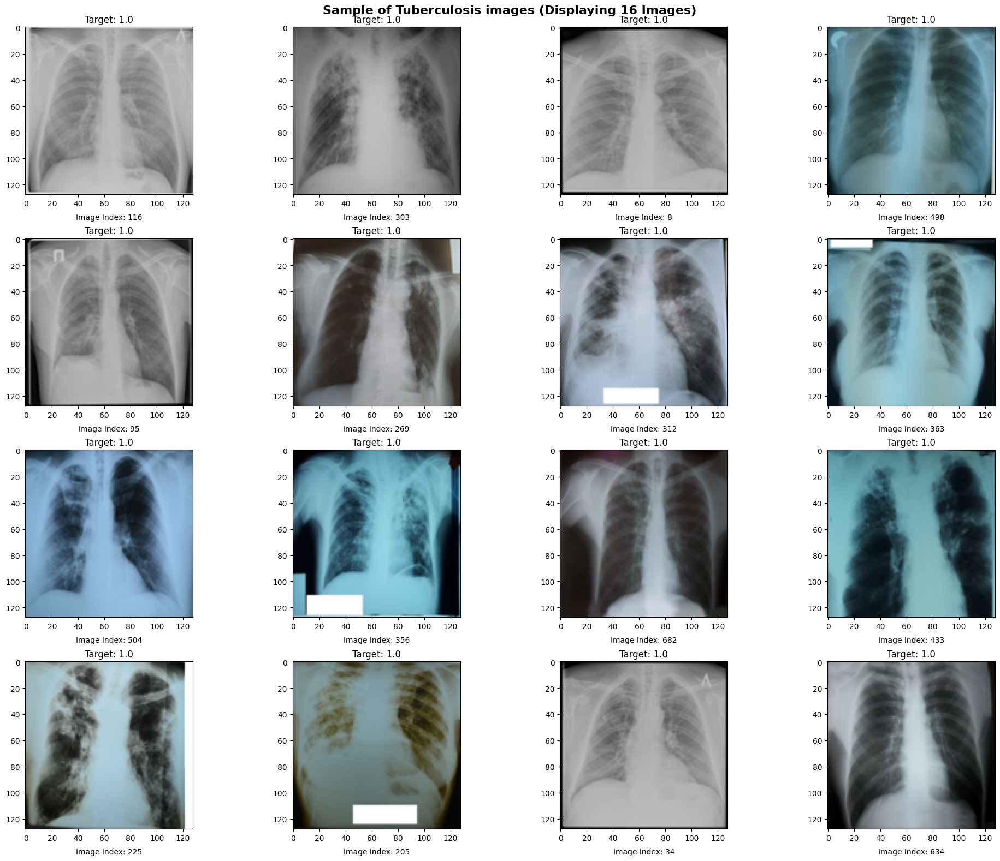

In [ ]:
show_image(images=tb,
           target=target_tb,
           title='Sample of Tuberculosis images',
           num_display=16,
           num_cols=4,
           cmap='gray',
           random_mode=True)

In [ ]:
from skimage import img_as_float
from skimage import exposure

In [ ]:
def plot_gray_scale_histogram(images, titles, bins=100):
    # Display results
    fig, axes = plt.subplots(2, len(images), figsize=(20, 8))

    for i, (title, image) in enumerate(zip(titles, images)):
        ax_img, ax_hist, ax_cdf, random_index = img_and_hist(
            image, axes[:, i], bins)

        mean_value = np.mean(image)
        std_value = np.std(image)
        min_value = np.min(image)
        max_value = np.max(image)

        ax_img.set_title('Random image of '+r'$\bf{' + f'{title}'+'}$' +
                         f'\nMean: {mean_value: .2f}, Std: {std_value: .2f}, Min: {min_value: .2f}, Max: {max_value: .2f}', fontsize=16)
        ax_img.text(0.5, -0.15, f'Image Index: {random_index}\n(Display random image)', transform=ax_img.transAxes,
                    fontsize=10, ha='center')

        y_min, y_max = ax_hist.get_ylim()
        ax_hist.set_title(
            'Distribution of pixel intensities of'+r'$\bf{' + f'{title}'+'}$', fontsize=16)
        ax_hist.set_ylabel('Number of pixels')
        ax_hist.set_yticks(np.linspace(0, y_max, 5))

        ax_cdf.set_ylabel('Fraction of total intensity')
        ax_cdf.set_yticks(np.linspace(0, 1, 5))

    plt.suptitle('Gray scale Histogram: Distribution of intensity pixel',
                 fontsize=16, fontweight='bold')
    # Prevent overlap of y-axis labels
    fig.tight_layout()
    plt.show()


def img_and_hist(image_data, axes, bins=100):

    image = img_as_float(image_data)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    random_index = np.random.randint(0, len(image_data))

    # Display image
    ax_img.imshow(image if image.shape[0] ==1 else image[random_index], cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    # ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf, random_index


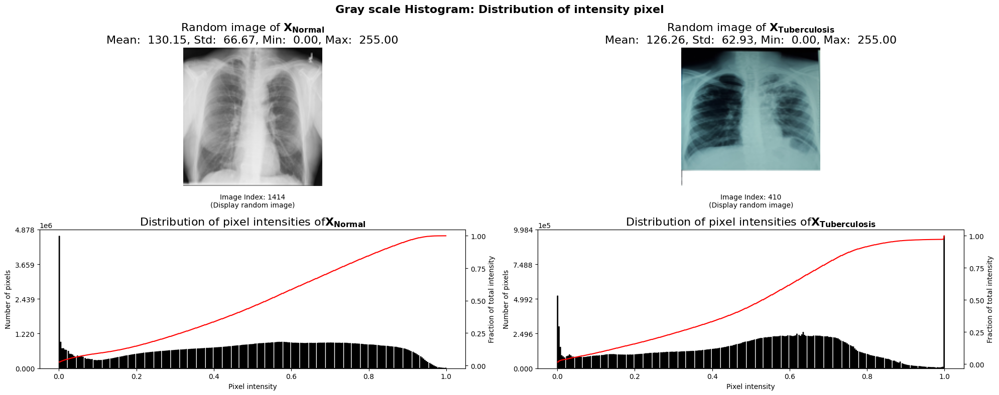

In [ ]:
images = [norm, tb]
subsets = ['X_{Normal}', 'X_{Tuberculosis}']
# For visualization
plot_gray_scale_histogram(images=images, titles=subsets, bins=555)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random

In [ ]:
def x_ray_image_augmentation(images, targets, sample_count):


    rotation_range = random.randint(-5, 5)
    zoom_range = random.uniform(0.0, 0.1)
    fill_mode = random.choice(['nearest',
                               'constant',
                               #    'reflect',               Not reccomend
                               'wrap'])

    # Create the ImageDataGenerator with randomized parameters
    datagen = ImageDataGenerator(
        rotation_range=rotation_range,
        zoom_range=zoom_range,
        fill_mode=fill_mode
    )

    augmented_data_generator = datagen.flow(images, targets, batch_size=1)
    batch_images, batch_labels = augmented_data_generator.next()
    for _ in tqdm(range(sample_count), desc='augmenting...'):
        batch_images, batch_labels = augmented_data_generator.next()
        try:
            combined_images = np.concatenate(
                (combined_images, batch_images), axis=0)
            combined_labels = np.concatenate(
                (combined_labels, batch_labels), axis=0)
        except NameError:
            combined_images = np.concatenate((images, batch_images), axis=0)
            combined_labels = np.concatenate((targets, batch_labels), axis=0)

    return combined_images, combined_labels

In [ ]:
# Scaled the dataset before do Augmentation
norm = norm/255
tb = tb/255

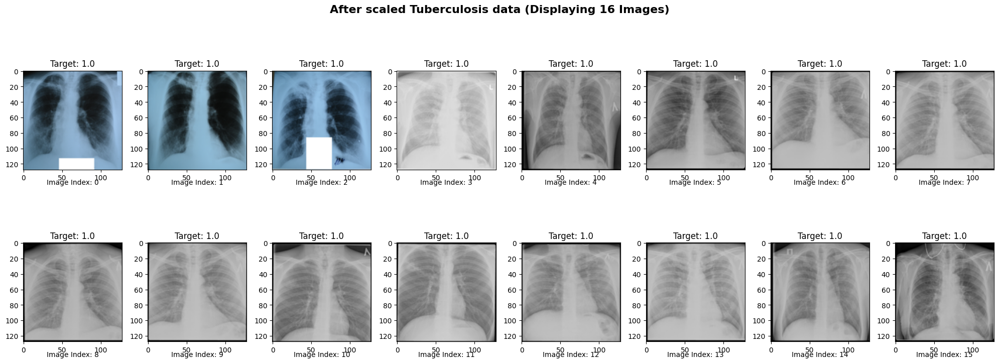

In [ ]:
show_image(images=tb,
           target=target_tb,
           title='After scaled Tuberculosis data',
           num_display=16,
           num_cols=8,
           cmap='gray',
           random_mode=False)


In [ ]:
tb_augmented, target_tb_augmented = x_ray_image_augmentation(images=tb,
                                                             targets=target_tb,
                                                             sample_count=2800)

augmenting...: 100%|██████████| 2800/2800 [15:07<00:00,  3.09it/s]


In [ ]:
tb_augmented.shape

(3500, 128, 128, 3)

In [ ]:
print(
    f'Before {tb.shape[0]}\nAfter Data Augmentation {tb_augmented.shape[0]}\n+{tb_augmented.shape[0]-tb.shape[0]} Training examples')

Before 700
After Data Augmentation 3500
+2800 Training examples


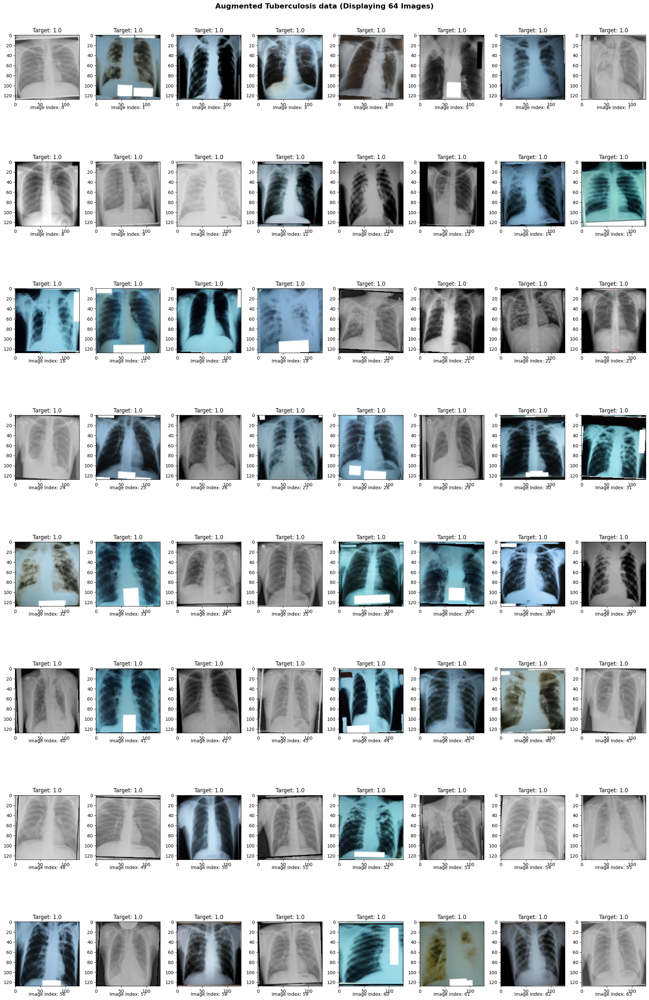

In [ ]:
# Start index since 700 to last to observe to new training images
show_image(images=tb_augmented[700:-1],
           target=target_tb_augmented[700:-1],
           title='Augmented Tuberculosis data',
           num_display=64,
           num_cols=8,
           cmap='gray',
           random_mode=False)

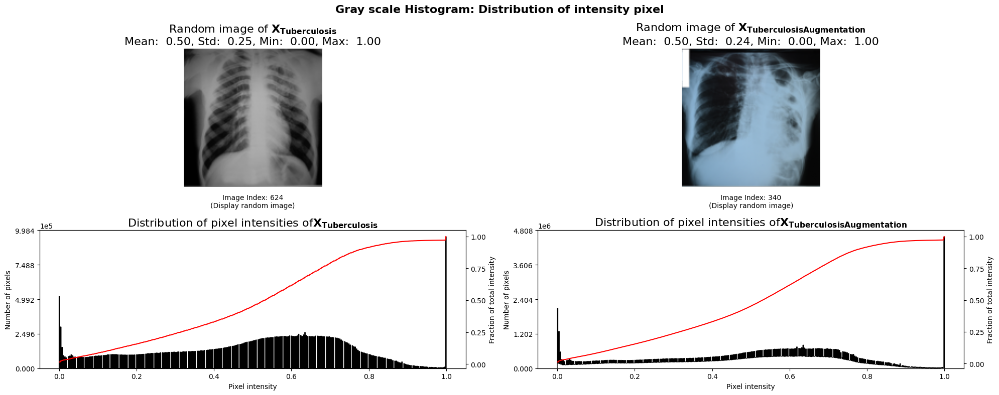

In [ ]:
images_2 = [tb, tb_augmented]
subsets_2 = ['X_{Tuberculosis}', 'X_{TuberculosisAugmentation}']
# For visualization
plot_gray_scale_histogram(images=images_2, titles=subsets_2, bins=555)

In [ ]:
# Concatenate df_norm and df_tb along the first axis (samples)
X = np.concatenate((norm, tb_augmented), axis=0)

# Concatenate target_norm and target_tb
y = np.concatenate((target_norm,  target_tb_augmented), axis=0)

In [ ]:
X.shape

(7000, 128, 128, 3)

In [ ]:
y.shape

(7000,)

In [ ]:
import pandas as pd


In [ ]:
y_df = pd.DataFrame(y)
y_df.value_counts()

,count
0,
0.0,3500
1.0,3500


In [ ]:
from skimage import exposure

In [ ]:
def contrast_stretching(X):
    p2, p98 = np.percentile(X, (2, 98))
    stretched_img = exposure.rescale_intensity(X, in_range=(p2, p98))
    return stretched_img

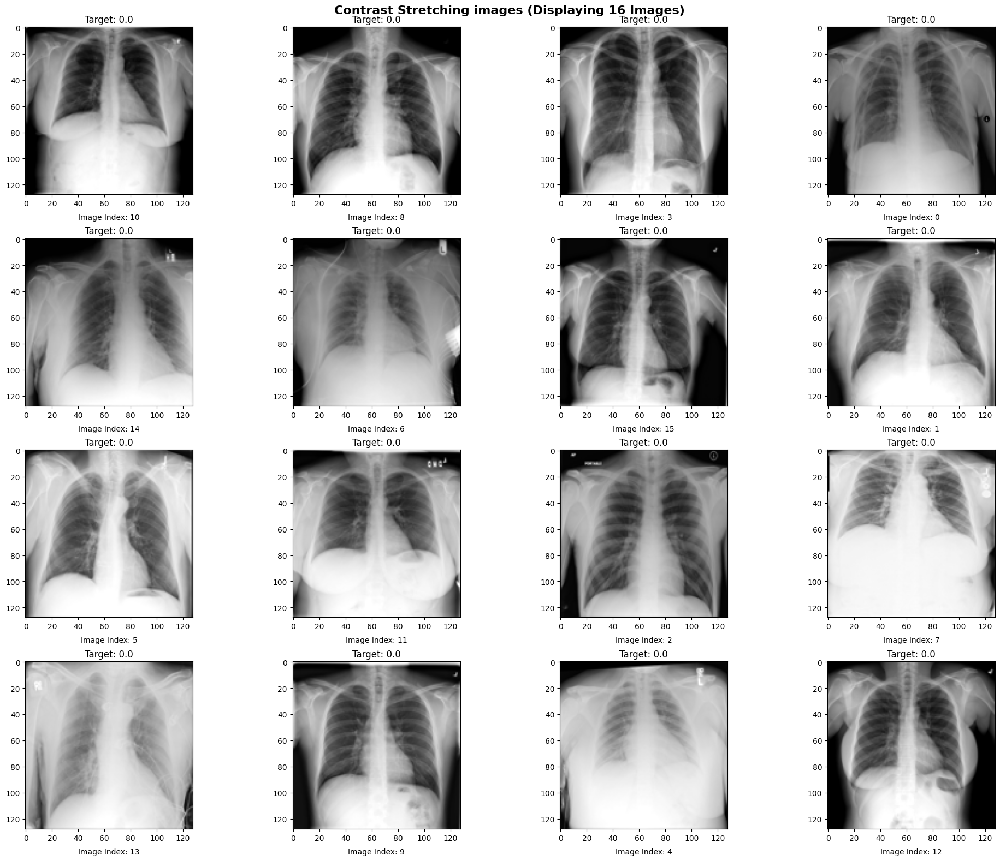

In [ ]:
X_stretched = contrast_stretching(X[0:16])
show_image(images=X_stretched,
           target=y,
           title='Contrast Stretching images',
           num_display=16,
           num_cols=4,
           cmap='gray',
           random_mode=True)

In [ ]:
def equalization(X):
    eq_img = exposure.equalize_hist(X)
    return eq_img

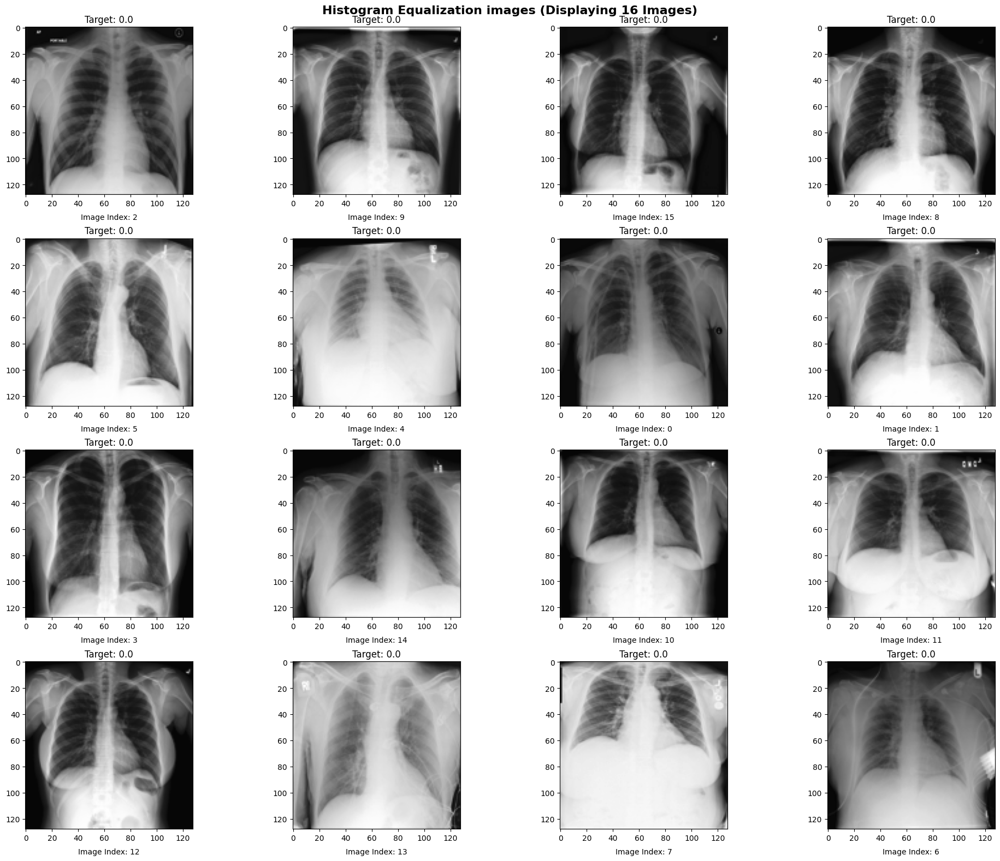

In [ ]:
X_eq = equalization(X[0:16])
show_image(images=X_eq,
           target=y,
           title='Histogram Equalization images',
           num_display=16,
           num_cols=4,
           cmap='gray',
           random_mode=True)

In [ ]:
def adaptive_equalization(X, clip_limit):

    X_normalized = (X - np.min(X)) / (np.max(X) - np.min(X))
    X_normalized = (X_normalized * 2) - 1  # Scale to -1 to 1
    adapteq_img = exposure.equalize_adapthist(
        X_normalized, clip_limit=clip_limit)

    return adapteq_img

In [ ]:
def adaptive_equalization(X, clip_limit, batch_size=None):

    if batch_size is None:
        # Normalize the input image to the range of -1 to 1 and perform adaptive histogram equalization
        X_normalized = (X - np.min(X)) / (np.max(X) - np.min(X))
        X_normalized = (X_normalized * 2) - 1  # Scale to -1 to 1
        adapteq_img = exposure.equalize_adapthist(
            X_normalized, clip_limit=clip_limit)
    else:
        # Process data in batches
        num_batches = int(np.ceil(len(X) / batch_size))
        batch_results = []

        for i in tqdm(range(num_batches),desc='process...'):
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(X))

            # Normalize the input image to the range of -1 to 1 and perform adaptive histogram equalization for each batch
            X_normalized = (X[start_idx:end_idx] - np.min(X[start_idx:end_idx])) / \
                (np.max(X[start_idx:end_idx]) - np.min(X[start_idx:end_idx]))
            X_normalized = (X_normalized * 2) - 1  # Scale to -1 to 1
            adapteq_img_batch = exposure.equalize_adapthist(
                X_normalized, clip_limit=clip_limit)
            batch_results.append(adapteq_img_batch)

        # Concatenate the batch results
        adapteq_img = np.concatenate(batch_results, axis=0)

    return adapteq_img


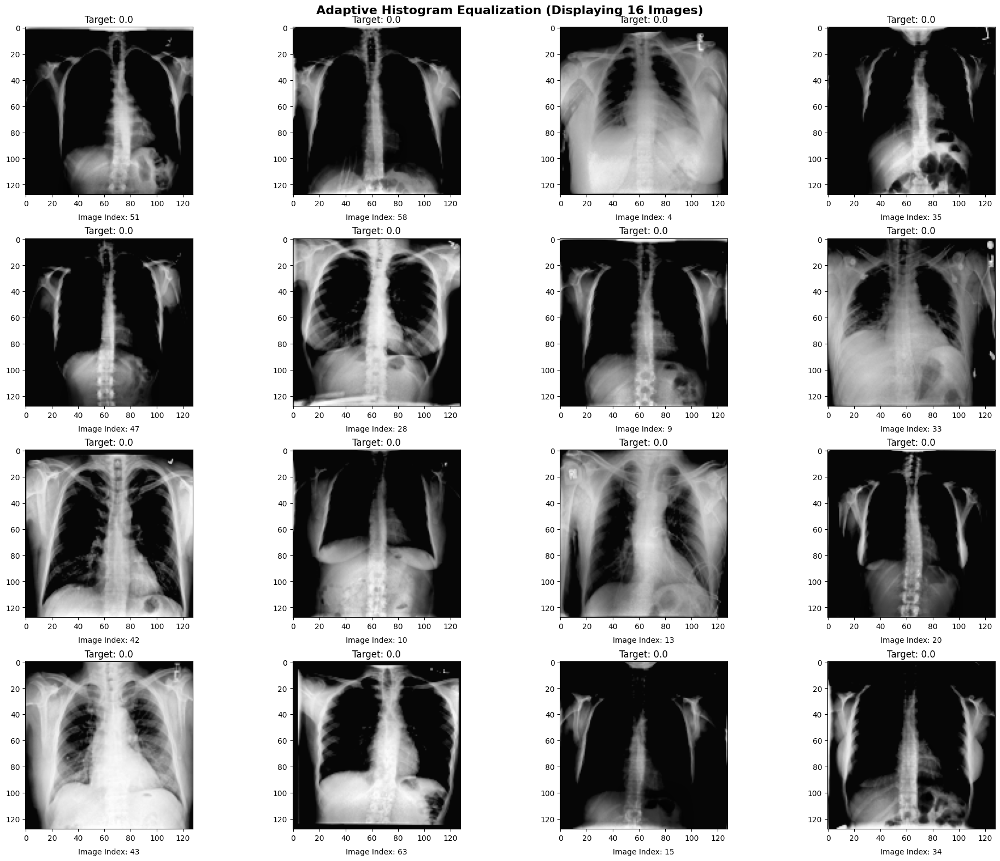

In [ ]:
X_adapteq = adaptive_equalization(X[0:64],0.03)
show_image(images=X_adapteq,
            target=y,
            title='Adaptive Histogram Equalization',
            num_display=16,
            num_cols=4,
            cmap='gray',
            random_mode=True)

In [ ]:
sample = X[0,:,:,:]
sample.shape

(128, 128, 3)

In [ ]:
# 1. Load a normal image
img = sample

# 2. Contrast stretching
img_cs = contrast_stretching(img)

# 3. Histogram Equalization
img_eq = equalization(img)

# 4. Adaptive Equalization
img_adapteq = adaptive_equalization(img, 0.03)

methods = ['Low contrast image', 'Contrast stretching',
           'Histogram equalization', 'Adaptive equalization']
images_3 = [img, img_cs, img_eq, img_adapteq]

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:438: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


In [ ]:
def img_and_hist_single_img(image, axes, bins=100):

    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    # ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf

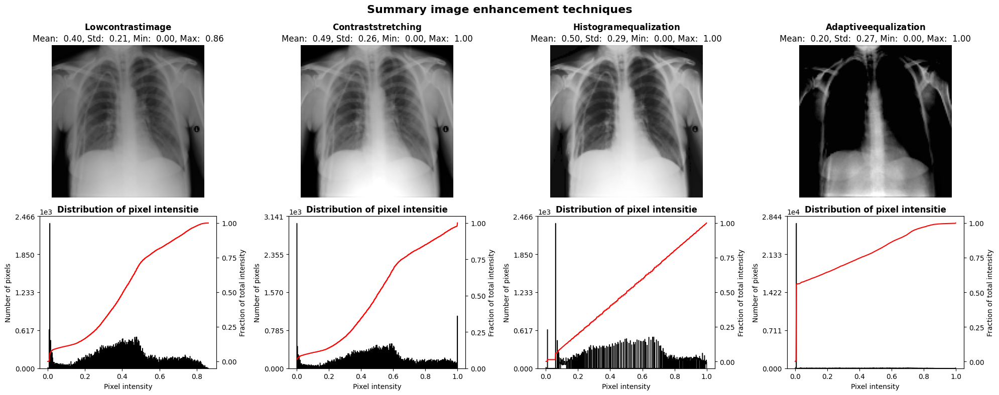

In [ ]:
# Display results
fig, axes = plt.subplots(2, 4, figsize=(20, 8))

for i, (method, image) in enumerate(zip(methods, images_3)):
    ax_img, ax_hist, ax_cdf = img_and_hist_single_img(image, axes[:, i], bins=555)

    mean_value = np.mean(image)
    std_value = np.std(image)
    min_value = np.min(image)
    max_value = np.max(image)

    ax_img.set_title(
        r'$\bf{' + f'{method}'+'}$'+f'\nMean: {mean_value: .2f}, Std: {std_value: .2f}, Min: {min_value: .2f}, Max: {max_value: .2f}', fontsize=12)

    y_min, y_max = ax_hist.get_ylim()
    ax_hist.set_title(
        'Distribution of pixel intensitie', fontsize=12, fontweight='bold')
    ax_hist.set_ylabel('Number of pixels')
    ax_hist.set_yticks(np.linspace(0, y_max, 5))

    ax_cdf.set_ylabel('Fraction of total intensity')
    ax_cdf.set_yticks(np.linspace(0, 1, 5))

plt.suptitle('Summary image enhancement techniques',
             fontsize=16, fontweight='bold')
fig.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Flatten, Dropout, Dense

In [ ]:
class CNN:
    def __init__(self,
                 input_shape=(128, 128, 3),
                 unit_size_rate=0.05,
                 conv_padding='same',
                 conv_kernel_size=(3, 3),
                 conv_stride=1,
                 pool_padding='same',
                 pool_kernel_size=(2, 2),
                 pool_stride=2,
                 dropout=0,
                 l1_lambda=None,
                 l2_lambda=None,
                 pooling_type='max',
                 epochs=5,
                 batch_size=64,
                 verbose=1):
        self.input_shape = input_shape
        self.unit_size_rate = unit_size_rate
        self.conv_padding = conv_padding
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.pool_padding = pool_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.dropout = dropout
        self.l1_lambda = l1_lambda
        self.l2_lambda = l2_lambda
        self.pooling_type = pooling_type
        self.epochs = epochs
        self.batch_size = batch_size
        self.verbose = verbose
        self.model = self.build_model()

    def build_model(self):
        reg_l1 = None
        reg_l2 = None

        if self.l1_lambda is not None:
            reg_l1 = tf.keras.regularizers.l1(self.l1_lambda)

        if self.l2_lambda is not None:
            reg_l2 = tf.keras.regularizers.l2(self.l2_lambda)

        if len(self.input_shape) == 2:
            # Add color channel for grayscale images
            self.input_shape = self.input_shape + (1,)

        model = Sequential()
        model.add(Conv2D(
            int(32 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            activation='relu',
            kernel_regularizer=reg_l1,
            input_shape=self.input_shape))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(64 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(128 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Flatten())
        model.add(Dense(
            units=int(128 * self.unit_size_rate),
            activation='relu',
            kernel_regularizer=reg_l2))

        model.add(Dropout(self.dropout))
        model.add(Dense(units=1, activation='sigmoid'))
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        return model

    def predict(self, X, threshold=0.5, verbose=0):
        return (self.model.predict(X, verbose=verbose) > threshold).astype("int32")

    def summary(self):
        self.model.summary()

    def train(self, X_train, y_train, X_val, y_val, epochs, batch_size, verbose=1):
        history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size if batch_size else self.batch_size,
            epochs=epochs if epochs else self.epochs,
            verbose=verbose,
            validation_data=(X_val, y_val)
        )
        return history

In [ ]:
cnn = CNN(unit_size_rate=1,
          input_shape=(128,128,3))

In [ ]:
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 32, 32, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 16, 16, 128)       0

In [ ]:
from sklearn.model_selection import train_test_split

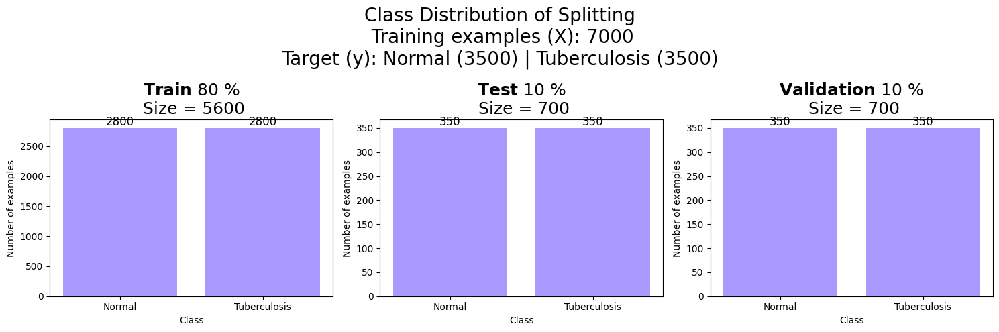

In [ ]:
def viz_class_distribution(X, y, title, classe_labels, train_percent=0.6, val_percent=0.2, test_percent=0.2):

    assert train_percent + val_percent + test_percent == 1.0, "Sum of train_percent, val_percent, and test_percent should be 1.0"

    # Convert y to integers
    y = y.astype(int)

    # Split the data
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=val_percent + test_percent, random_state=42, stratify=y)

    test_size = test_percent / (val_percent + test_percent)
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=test_size, random_state=42, stratify=y_temp)

    # Create a subplot with 3 columns and 1 row
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # List of subset names
    subset_names = ['Train', 'Test', 'Validation']
    n = len(X)

    # Iterate over subsets
    for i, subset in enumerate([(X_train, y_train), (X_test, y_test), (X_val, y_val)]):
        X_subset, y_subset = subset
        n_subset = len(y_subset)
        # Get the class counts
        class_counts = np.bincount(y_subset)

        # Plot histogram for the current subset
        axs[i].bar(classe_labels, class_counts, color='#AA99FF')
        subtitle = r'$\bf{' + subset_names[i] + \
            '}$' + f' {int(n_subset/n*100)} %'
        axs[i].set_title(
            subtitle + f'\n Size = {X_subset.shape[0]}', fontsize=18)
        axs[i].set_xlabel('Class')
        axs[i].set_ylabel('Number of examples')

        # Add labels to the bars
        for j, count in enumerate(class_counts):
            axs[i].text(j, count, str(count), ha='center',
                        va='bottom', fontsize=12)

    class_counts = np.bincount(y)
    class_balance_text = ' | '.join(
        [f'{class_label} ({count})' for class_label, count in zip(classe_labels, class_counts)])
    plt.suptitle(f'{title}' + f'\n Training examples (X): {X.shape[0]}' +
                 f'\nTarget (y): {class_balance_text}', fontsize=20)

    plt.tight_layout()
    plt.show()

    return X_train, y_train, X_test, y_test, X_val, y_val
X_train, y_train, X_test, y_test, X_val, y_val = viz_class_distribution(X=X,
                        y=y,
                        title='Class Distribution of Splitting',
                        classe_labels=['Normal', 'Tuberculosis'],
                        train_percent=0.8,
                        val_percent=0.1,
                        test_percent=0.1)


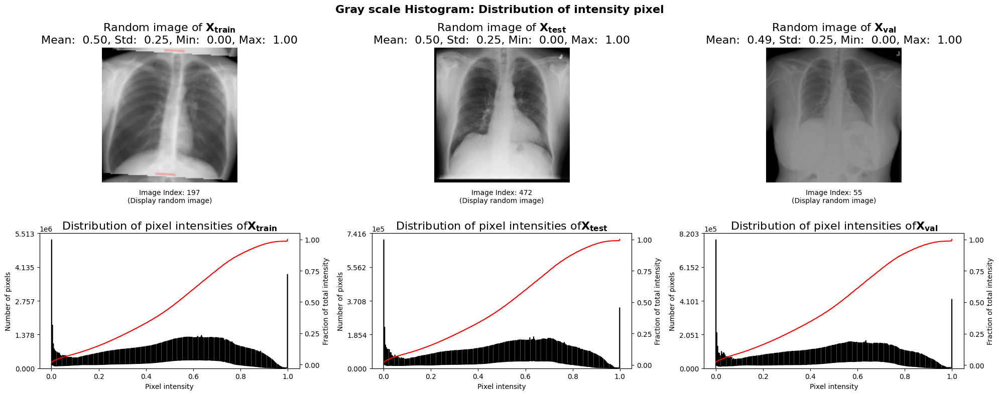

In [ ]:
images = [X_train, X_test, X_val]
subsets = ['X_{train}', 'X_{test}', 'X_{val}']
# For visualization
plot_gray_scale_histogram(images=images, titles=subsets, bins=555)

In [ ]:
model_config = {
    # (height, width, channels)
    'input_shape': (128, 128,3),
    'unit_size_rate': 0.05,
    'l1_lambda': None,
    'l2_lambda': None,

    'conv_padding': 'same',
    'conv_kernel_size': (3, 3),
    'conv_stride': 1,

    'pool_padding': 'same',
    'pool_kernel_size': (2, 2),
    'pool_stride': 2,

    'dropout': 0,
    'pooling_type': 'max'
}

# Build model
model_1st = CNN(**model_config).build_model()
model_1st.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 128, 128, 1)       28        
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 64, 64, 1)         0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 64, 64, 3)         30        
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 32, 32, 3)         0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 32, 32, 6)         168       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 16, 16, 6)        

In [ ]:
import time
optimizer = tf.keras.optimizers.Adam()
optimizer_config= optimizer.get_config()
optimizer_config


{'name': 'Adam',
 'weight_decay': None,
 'clipnorm': None,
 'global_clipnorm': None,
 'clipvalue': None,
 'use_ema': False,
 'ema_momentum': 0.99,
 'ema_overwrite_frequency': None,
 'jit_compile': False,
 'is_legacy_optimizer': False,
 'learning_rate': 0.001,
 'beta_1': 0.9,
 'beta_2': 0.999,
 'epsilon': 1e-07,
 'amsgrad': False}

In [ ]:
start_time = time.time()
# verbose is progress bar; verbose = 1 display, verbose = don't display
verbose = 1
# Compile the model
model_1st.compile(loss='binary_crossentropy',
                   optimizer=optimizer,
                   metrics='accuracy')

# Train the model
history = model_1st.fit(X_train, y_train,
                             epochs=30,
                             batch_size=64,
                             validation_data=(X_val, y_val),
                             verbose=verbose)

end_time = time.time()
training_time = end_time - start_time
training_time

Epoch 1/30
88/88 [==============================] - 5s 47ms/step - loss: 0.4900 - accuracy: 0.7411 - val_loss: 0.3070 - val_accuracy: 0.8500
Epoch 2/30
88/88 [==============================] - 4s 41ms/step - loss: 0.2388 - accuracy: 0.9018 - val_loss: 0.2164 - val_accuracy: 0.9214
Epoch 3/30
88/88 [==============================] - 4s 42ms/step - loss: 0.1976 - accuracy: 0.9259 - val_loss: 0.2040 - val_accuracy: 0.9300
Epoch 4/30
88/88 [==============================] - 4s 41ms/step - loss: 0.1716 - accuracy: 0.9380 - val_loss: 0.1672 - val_accuracy: 0.9457
Epoch 5/30
88/88 [==============================] - 4s 41ms/step - loss: 0.1492 - accuracy: 0.9464 - val_loss: 0.1460 - val_accuracy: 0.9486
Epoch 6/30
88/88 [==============================] - 4s 42ms/step - loss: 0.1406 - accuracy: 0.9477 - val_loss: 0.2568 - val_accuracy: 0.9071
Epoch 7/30
88/88 [==============================] - 4s 41ms/step - loss: 0.1437 - accuracy: 0.9479 - val_loss: 0.1301 - val_accuracy: 0.9486
Epoch 8/30
88

114.32240581512451

In [ ]:
print(f'Training time in minutes: {training_time/60:.2f} minutes')

Training time in minutes: 1.91 minutes


In [ ]:
get_config = {
            'Optimizer parameters Configuration': {
                'optimizer_name': optimizer_config['name'],
                'learning_rate': optimizer_config['learning_rate'],
                'beta1': optimizer_config['beta_1'],
                'beta2': optimizer_config['beta_2'],
                'epsilon': optimizer_config['epsilon'],
            },
            'Hyperparameters Configuration': {
                'conv_padding': model_config['conv_padding'],
                'conv_kernel_size': model_config['conv_kernel_size'],
                'conv_stride': model_config['conv_stride'],
                'pool_padding': model_config['pool_padding'],
                'pool_kernel_size': model_config['pool_kernel_size'],
                'pool_stride': model_config['pool_stride'],
                'pooling_type': model_config['pooling_type'],
            },
            'Model Architecture Configuration': {
                'input_shape': model_config['input_shape'],
                'unit_size_rate': model_config['unit_size_rate']
            },
            'Model Training Configuration': {
                'batch_size': 20,
                'epoch': 64
            },
        }
get_config

{'Optimizer parameters Configuration': {'optimizer_name': 'Adam',
  'learning_rate': 0.001,
  'beta1': 0.9,
  'beta2': 0.999,
  'epsilon': 1e-07},
 'Hyperparameters Configuration': {'conv_padding': 'same',
  'conv_kernel_size': (3, 3),
  'conv_stride': 1,
  'pool_padding': 'same',
  'pool_kernel_size': (2, 2),
  'pool_stride': 2,
  'pooling_type': 'max'},
 'Model Architecture Configuration': {'input_shape': (128, 128, 3),
  'unit_size_rate': 0.05},
 'Model Training Configuration': {'batch_size': 20, 'epoch': 64}}

In [ ]:
def get_history(history,
                model,
                training_time:float,
                ref_name:str,
                title:str):

        best_epoch = np.argmax(history.history['val_accuracy'])
        best_train_epoch = np.argmax(history.history['accuracy'])

        # Create a 1x2 grid of subplots
        fig, axes = plt.subplots(1, 2, figsize=(24, 15))

        # Plot training and validation accuracy
        axes[0].plot(history.epoch, history.history['accuracy'],
                     label='Train Accuracy')
        axes[0].plot(history.epoch, history.history['val_accuracy'],
                     label='Validation Accuracy')
        axes[0].scatter(best_epoch, history.history['val_accuracy']
                        [best_epoch], color='r', label='Best Epoch (Validation)')
        axes[0].scatter(best_train_epoch, history.history['accuracy']
                        [best_train_epoch], color='g', label='Best Epoch (Train)')

        # Annotate the best validation accuracy point
        best_accuracy = history.history['val_accuracy'][best_epoch]
        random_offset_x = 10
        random_offset_y = np.random.randint(-30, 30)
        axes[0].annotate(f'{best_accuracy:.3f}',
                         xy=(best_epoch, best_accuracy),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Accuracy (%)')
        axes[0].set_title('Training and Validation Accuracy')
        axes[0].legend()

        # Annotate the best training accuracy point
        best_train_accuracy = history.history['accuracy'][best_train_epoch]
        random_offset_y = np.random.randint(-30, 30)
        axes[0].annotate(f'{best_train_accuracy:.3f}',
                         xy=(best_train_epoch, best_train_accuracy),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Plot training and validation loss
        axes[1].plot(history.epoch,
                    history.history['loss'], label='Train Loss')
        axes[1].plot(history.epoch, history.history['val_loss'],
                     label='Validation Loss')
        axes[1].scatter(best_epoch, history.history['val_loss']
                        [best_epoch], color='r', label='Best Epoch (Validation)')
        axes[1].scatter(best_train_epoch,history.history['loss']
                        [best_train_epoch], color='g', label='Best Epoch (Train)')
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Loss')
        axes[1].set_title('Training and Validation Loss')
        axes[1].legend()

        # Annotate the best validation loss point
        best_loss = history.history['val_loss'][best_epoch]
        random_offset_y = np.random.randint(-30, 30)
        axes[1].annotate(f'{best_loss:.3f}',
                         xy=(best_epoch, best_loss),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Annotate the best training loss point
        best_train_loss = history.history['loss'][best_train_epoch]
        random_offset_y = np.random.randint(-30, 30)
        axes[1].annotate(f'{best_train_loss:.3f}',
                         xy=(best_train_epoch, best_train_loss),
                         xytext=(random_offset_x, random_offset_y),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Calculate best validation accuracy in percentage
        best_accuracy_percentage = round(best_accuracy * 100, 2)

        # String for performance, accuracy, and training time
        minutes = int(training_time // 60)
        seconds = int(training_time % 60)

        # model summary
        stringlist = []
        model.summary(print_fn=lambda x: stringlist.append(x))
        short_model_summary = "\n".join(stringlist)

        # Set the text for the parameters on the right side
        performance = r'$\bf{' + f'Ref. name: {ref_name}' + '}$' + f"\nBest Validation Accuracy: {best_accuracy_percentage}%" + \
            f"\nBest Train Accuracy: {history.history['accuracy'][best_train_epoch] * 100:.2f}%" + \
            f", Training Time: {minutes} minutes {seconds} seconds"
        fig.suptitle(r'$\bf{' + title + '}$' +
                     '\n' + performance, fontsize=18)

        fig.text(1.05, 1.00, r'$\bf{' + 'Config Parameters:' + '}$', fontsize=16,
                 color='black', ha='left', transform=plt.gcf().transFigure)

        y_coord = 0.98  # Initial y-coordinate

        # Set the line height between each parameter group and each parameter within a group
        line_height = 0.028

        for group, params in get_config.items():
            fig.text(1.05, y_coord, r'$\bf{' + f'{group}:' + '}$', fontsize=14,
                     color='black', ha='left', transform=plt.gcf().transFigure)
            y_coord -= line_height

            for key, value in params.items():
                fig.text(1.05, y_coord, f"{key}: {value}", fontsize=12,
                         color='black', ha='left', transform=plt.gcf().transFigure)
                y_coord -= line_height

        fig.text(1.05, 0.01, r'$\bf{' + f'Model Summary:' + '}$' + f'\n{short_model_summary}',
                 fontsize=10, color='black', ha='left', transform=plt.gcf().transFigure)

        plt.tight_layout()
        plt.show()


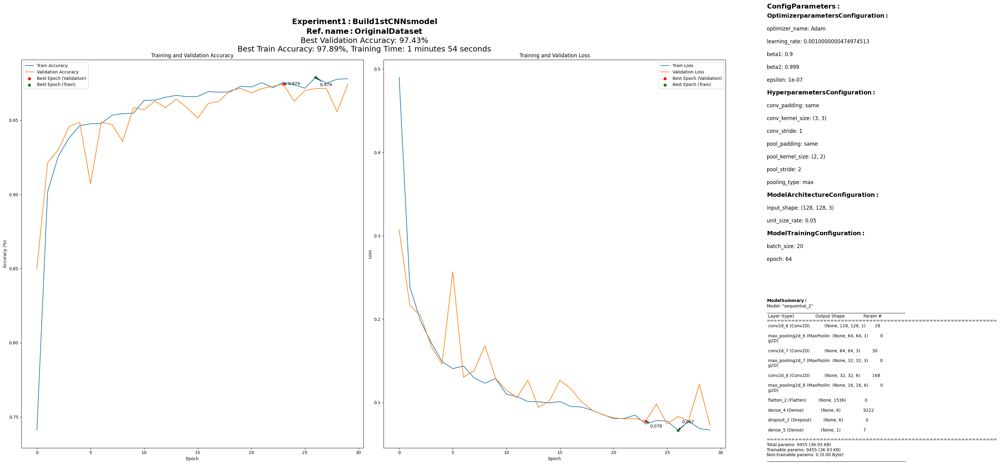

In [ ]:
title = 'Experiment 1: Build 1st CNNs model'
get_history(history=history,
            model=model_1st,
            training_time=training_time,
            title=title,
            ref_name='Original Dataset')

In [ ]:
import json
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, accuracy_score, roc_curve, roc_auc_score, f1_score

In [ ]:
 def evaluate(estimator_name, estimator, X, y_actual, subset_name, training_time, threshold=None):

        # Model Prediction/Y hat
        y_pred = estimator.predict(
            X)
        # Handling Output Layer of Activation='sigmoid'
        threshold = threshold if threshold else 0.5
        y_pred_binary = (y_pred > threshold).astype(int).flatten()

        # Calculate ROC curve and AUC score
        fpr, tpr, thresholds = roc_curve(y_actual, y_pred_binary)
        auc_score = roc_auc_score(y_actual, y_pred_binary)
        # Classification Report
        report = classification_report(
            y_actual, y_pred_binary, output_dict=True)
        report_dict = json.loads(json.dumps(report))

        # Extract precision and recall from report_dict
        precision = report_dict['weighted avg']['precision']
        recall = report_dict['weighted avg']['recall']
        accuracy = report_dict['accuracy']
        f1 = report_dict['weighted avg']['f1-score']

        # Confusion Matrix
        cm = confusion_matrix(y_actual, y_pred_binary)
        TP = cm[0][0]
        FP = cm[0][1]
        FN = cm[1][0]
        TN = cm[1][1]
        total_seconds = training_time
        minutes = int(training_time // 60)
        seconds = int(training_time % 60)
        training_time_ = "{} minutes {} seconds".format(minutes, seconds)

        accuracy_train = history.history['accuracy']
        accuracy_val = history.history['val_accuracy']

        performance_info = {
            'Model': estimator_name,
            'accuracy_train': accuracy_train,
            'accuracy_val': accuracy_val,
            'Subset': subset_name,
            'Training time': training_time_,
            'Training in seconds': total_seconds,
            'TP': TP,
            'FP': FP,
            'FN': FN,
            'TN': TN,
            'Precision': precision,
            'Recall': recall,
            'F1': f1,
            'AUC': auc_score,
            'Accuracy': accuracy,
        }
        return pd.DataFrame([performance_info])

In [ ]:
evaluate(estimator_name='CNN',
         estimator=model_1st,
         X=X_train,
         y_actual=y_train,
         subset_name='Training',
         training_time=training_time
         )

175/175 [==============================] - 3s 17ms/step


,Model,accuracy_train,accuracy_val,Subset,Training time,Training in seconds,TP,FP,FN,TN,Precision,Recall,F1,AUC,Accuracy
0,CNN,"[0.7410714030265808, 0.9017857313156128, 0.925...","[0.8500000238418579, 0.9214285612106323, 0.930...",Training,1 minutes 54 seconds,114.322406,2735,65,30,2770,0.983111,0.983036,0.983035,0.983036,0.983036


In [ ]:
evaluate(estimator_name='CNN',
         estimator=model_1st,
         X=X_test,
         y_actual=y_test,
         subset_name='Test',
         training_time=training_time
         )

22/22 [==============================] - 0s 16ms/step


,Model,accuracy_train,accuracy_val,Subset,Training time,Training in seconds,TP,FP,FN,TN,Precision,Recall,F1,AUC,Accuracy
0,CNN,"[0.7410714030265808, 0.9017857313156128, 0.925...","[0.8500000238418579, 0.9214285612106323, 0.930...",Test,1 minutes 54 seconds,114.322406,337,13,7,343,0.971567,0.971429,0.971426,0.971429,0.971429


In [ ]:
def plot_confusion_matrix(y_actual, y_pred, subset_name):
    y_pred_binary = (y_pred > 0.5).astype(int).flatten()
    cm = confusion_matrix(y_actual, y_pred_binary)
    labels = ['Negative', 'Positive']

    # Extract TP, TN, FP, FN
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)  # Sensitivity or True Positive Rate
    specificity = tn / (tn + fp)  # Specificity or True Negative Rate

    plt.figure(figsize=(18, 9))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels, yticklabels=labels)



    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {subset_name}\n'
              f'True Positives: {tp} | True Negatives: {tn}\n'
              f'False Positives: {fp} (Type I error) | False Negatives: {fn} (Type II error)\n'
              f'Sensitivity (True Positive Rate): {sensitivity:.4f} | Specificity (True Negative Rate): {specificity:.4f}',
              loc='center', wrap=True)
    plt.show()
y_pred_test = model_1st.predict(X_test)


22/22 [==============================] - 0s 16ms/step


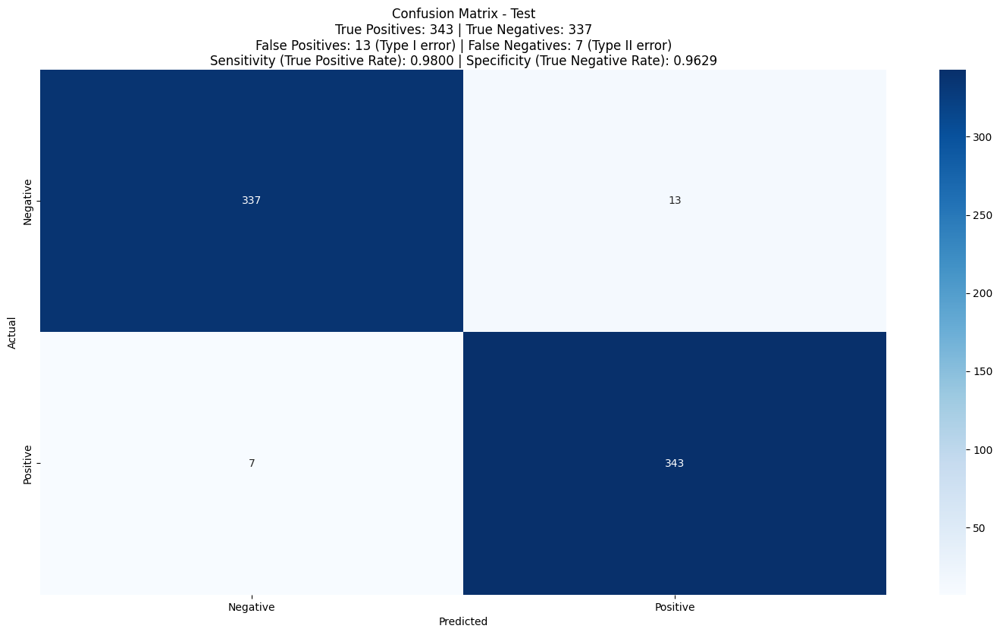

In [ ]:
plot_confusion_matrix(y_actual=y_test,
                      y_pred=y_pred_test,
                      subset_name='Test')

In [ ]:
def plot_roc(y_actual, y_pred, subset_name):
    fpr, tpr, thresholds = roc_curve(y_actual, y_pred)
    # Print ROC Curve
    plt.figure(figsize=(18, 9))
    plt.plot(fpr, tpr, marker='o', linestyle='-',)
    plt.xlabel('False positive rate (1-Specificity)')
    plt.ylabel('True positive rate (Sensitivity)')
    plt.title(f'ROC Curve - {subset_name}')
    plt.grid()
    plt.show()

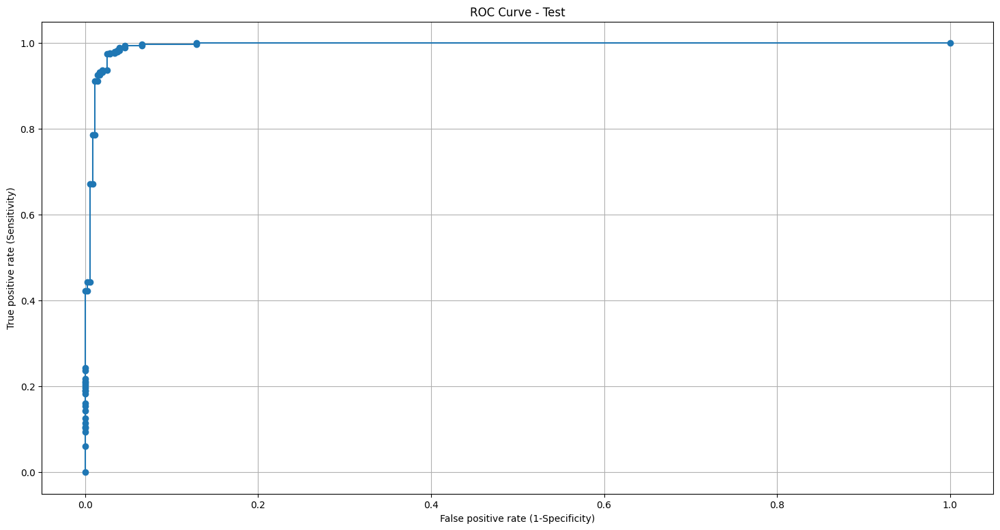

In [ ]:
plot_roc(y_actual=y_test, y_pred=y_pred_test, subset_name='Test')

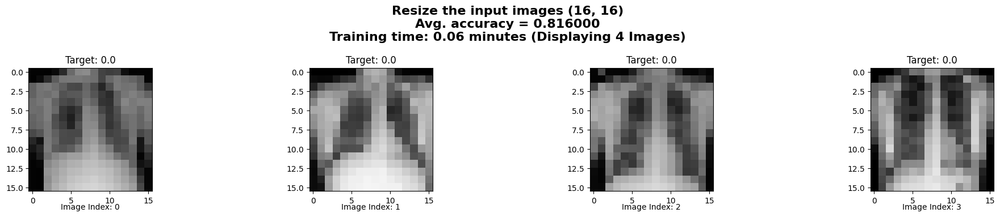

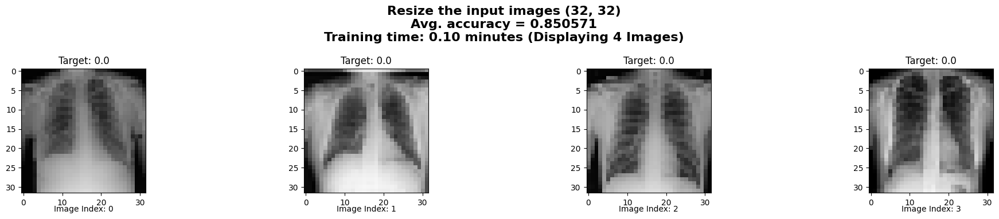

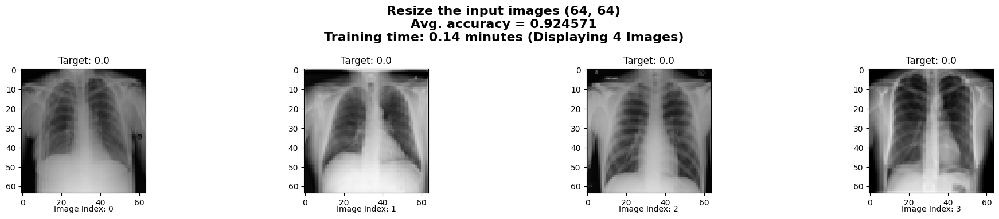

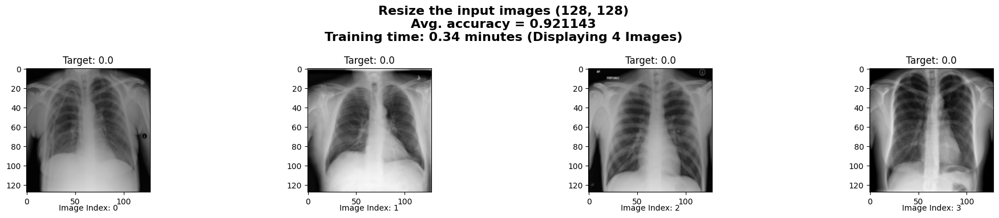

In [ ]:
target_shapes = [(16, 16),(32, 32), (64, 64), (128, 128)]
for target_shape in target_shapes:
    X_resized = tf.image.resize(X, target_shape).numpy()
    model_config = {
        # (height, width, channels)
        'input_shape': target_shape +(3,),
        'unit_size_rate': 0.05,
        'l1_lambda': None,
        'l2_lambda': None,

        'conv_padding': 'same',
        'conv_kernel_size': (3, 3),
        'conv_stride': 1,

        'pool_padding': 'same',
        'pool_kernel_size': (2, 2),
        'pool_stride': 2,

        'dropout': 0,
        'pooling_type': 'max'
    }

    # Build model
    model = CNN(**model_config)

    X_train, X_temp, y_train, y_temp = train_test_split(
    X_resized, y, test_size=0.2, random_state=42, stratify=y)

    X_test, X_val, y_test, y_val = train_test_split(
        X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)
    # Train the model
    start_time = time.time()

    history = model.train(X_train, y_train, X_val, y_val,
                                 epochs=5,
                                 batch_size=64,
                                 verbose=0)
    end_time = time.time()
    training_time = end_time - start_time
    mean_acc = np.mean(history.history['val_accuracy'])
    show_image(images=X_resized, target=y,
               title=f'Resize the input images {target_shape}\nAvg. accuracy = {mean_acc:2f}\nTraining time: {training_time/60:.2f} minutes',
               num_display=4,
               num_cols=4,
               random_mode=False)


In [ ]:
def compare_actual_and_predicted_xray(estimator, images, target, title, num_display=16, num_cols=4, random_mode=False):

    n_cols = min(num_cols, num_display)
    n_rows = int(np.ceil(num_display / n_cols))

    title = r'$\bf{' + "Actual-Image" + '}$' + " vs " + \
        r'$\bf{' + "Model-Prediction" + '}$'
    y_hat = estimator.predict(images)
    prediction = (y_hat > 0.5).astype(int).flatten()

    n_images = min(num_display, len(images))
    if random_mode:
        random_indices = np.random.choice(
            len(images), num_display, replace=False)
    else:
        random_indices = np.arange(num_display)

    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols, figsize=(20, 4*n_rows))
    for i, ax in enumerate(axes.flatten()):
        if i >= n_images:  # Check if the index exceeds the available number of images
            break
        # Incase (Did PCA)
        index = random_indices[i]
        if len(images.shape) == 2:
            image = images[index].reshape((128, 128)).astype(int)
        else:
            image = images[index]
        actual_label = target[index]
        model_pred_label = prediction[index]
        model_prob = '{:.3f}'.format(float(y_hat[index]))
        ax.imshow(
            image, cmap='gray' if actual_label == model_pred_label else 'OrRd')
        ax.set_title(
            f"Actual: {actual_label},\nModel Prediction: {model_pred_label}\nProbability: {model_prob}")
    plt.suptitle(f"{title} (Displaying {num_display} Images)",
                 fontsize=16, fontweight='bold')

    fig.set_facecolor('white')
    plt.tight_layout()
    plt.show()


22/22 [==============================] - 0s 17ms/step


<ipython-input-65-af4e1e4d2089>:31: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  model_prob = '{:.3f}'.format(float(y_hat[index]))


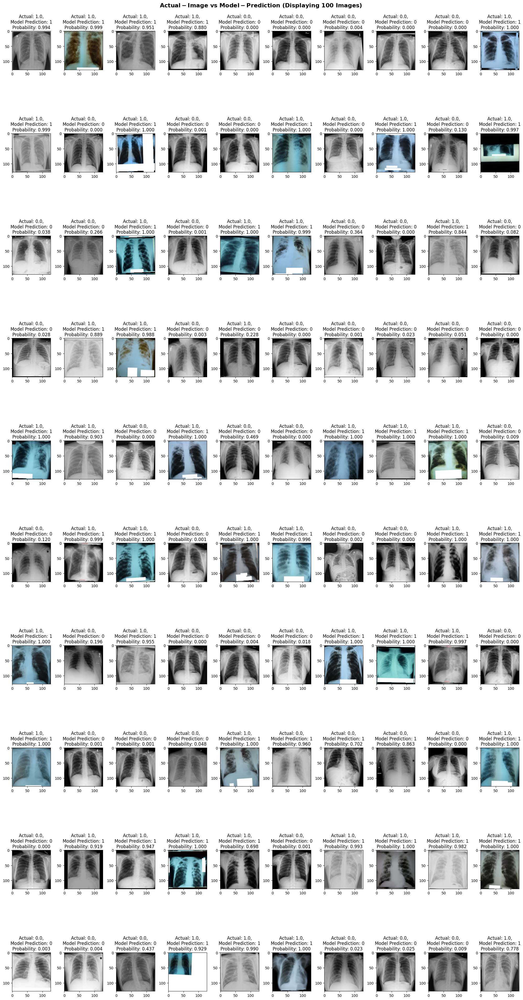

In [ ]:
compare_actual_and_predicted_xray(
                estimator=model_1st,
                images=X_test,
                target=y_test,
                title=None,
                num_display=100,
                num_cols=10,
                random_mode=True)